## Reading Dataset and Visualizing Network Graph

In [1]:
# importing required modules
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import igraph as ig
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report

In [2]:
# reading and loading the dataset
Dataset = pd.read_csv('Final_Network.csv')

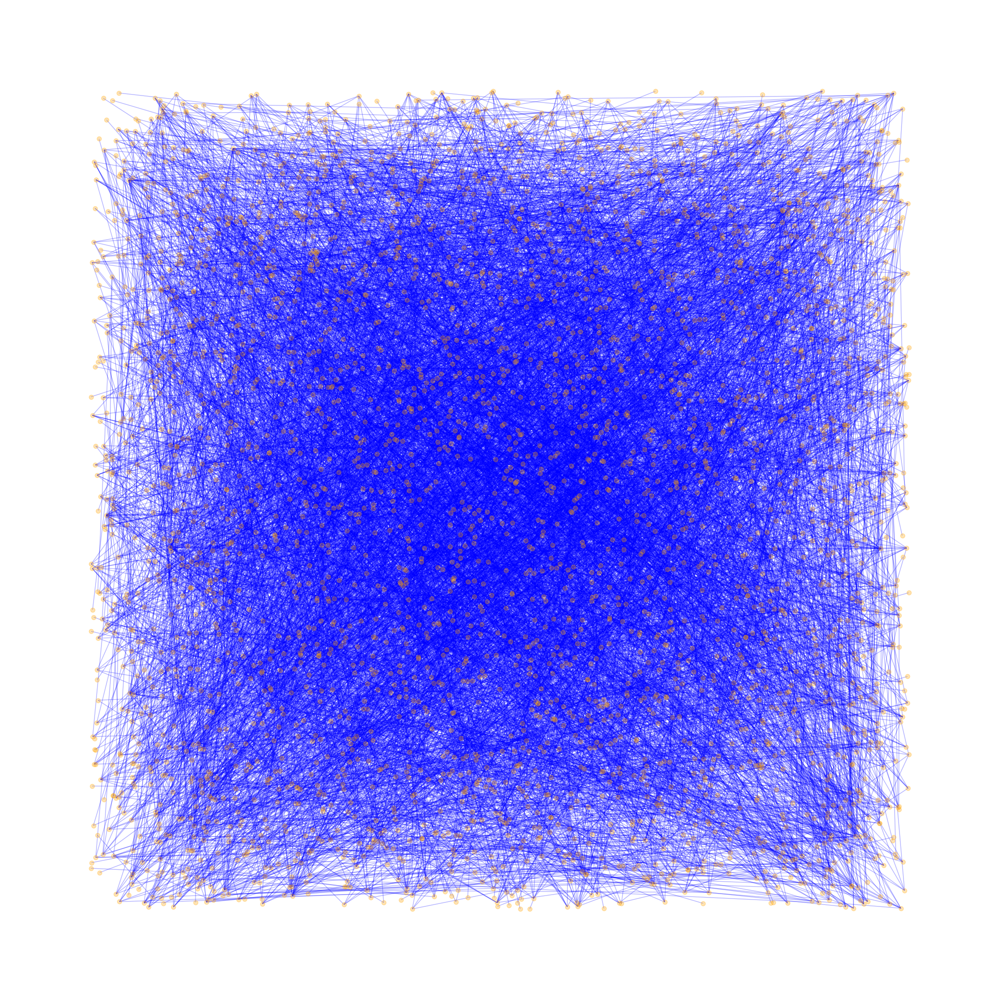

In [3]:
# graph object construction
Graph = nx.from_pandas_edgelist(Dataset, 'Source', 'Target', create_using = nx.Graph())
plt.figure(figsize = (20, 20))
pos = nx.random_layout(Graph, seed = 30)
nx.draw(Graph, with_labels = False,  pos = pos, node_size = 40, alpha = 0.3, edge_color = 'blue', node_color = 'orange')
plt.show()

In [27]:
nx.average_shortest_path_length(Graph)

7.676695896414892

In [28]:
nx.diameter(Graph)

19

In [30]:
nx.periphery(Graph)

[2827,
 2994,
 2995,
 3397,
 3398,
 3399,
 3400,
 3401,
 2826,
 2828,
 2829,
 2830,
 2831,
 2832,
 2833,
 2834,
 2443,
 2444,
 2445,
 2446,
 2447,
 2835,
 2836,
 2837,
 2838,
 2839,
 2840,
 2841,
 2842,
 2843,
 2276,
 2324,
 2844,
 2845]

In [32]:
nx.center(Graph)

[63,
 8,
 33,
 37,
 80,
 93,
 97,
 99,
 100,
 429,
 116,
 307,
 193,
 449,
 331,
 243,
 668,
 362,
 752,
 768,
 1408,
 1494,
 1963]

In [33]:
nx.transitivity(Graph)

0.30892594598777373

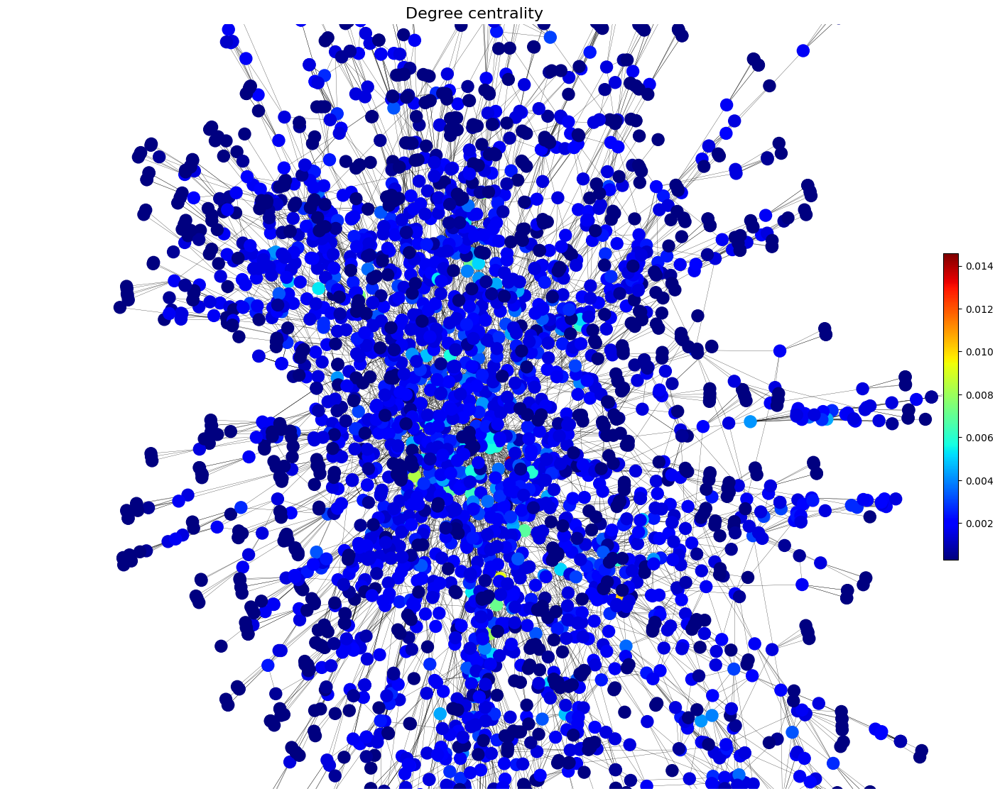

In [43]:
connected_component_subgraphs = (Graph.subgraph(c) for c in nx.connected_components(Graph))

Gc = max(connected_component_subgraphs, key=len)

plt.figure(figsize=(20,14))
degree_centr = nx.degree_centrality(Gc)
node_colors = list(degree_centr.values())
coords = nx.spring_layout(Gc)

nodes = nx.draw_networkx_nodes(Gc, pos = coords,
                               node_color=node_colors,
                               node_size = 150,
                               nodelist=list(degree_centr.keys()),
                               cmap = 'jet')
edges = nx.draw_networkx_edges(Gc, pos = coords, width = .2)
plt.xlim([-.95, .9])
plt.ylim([-.5, .6])
plt.colorbar(nodes, shrink=.4, pad=.0005, aspect=20)
plt.title('Degree centrality', fontsize = 16)
plt.axis("off")

top_nodes = sorted(degree_centr, key = degree_centr.get)[-3:]

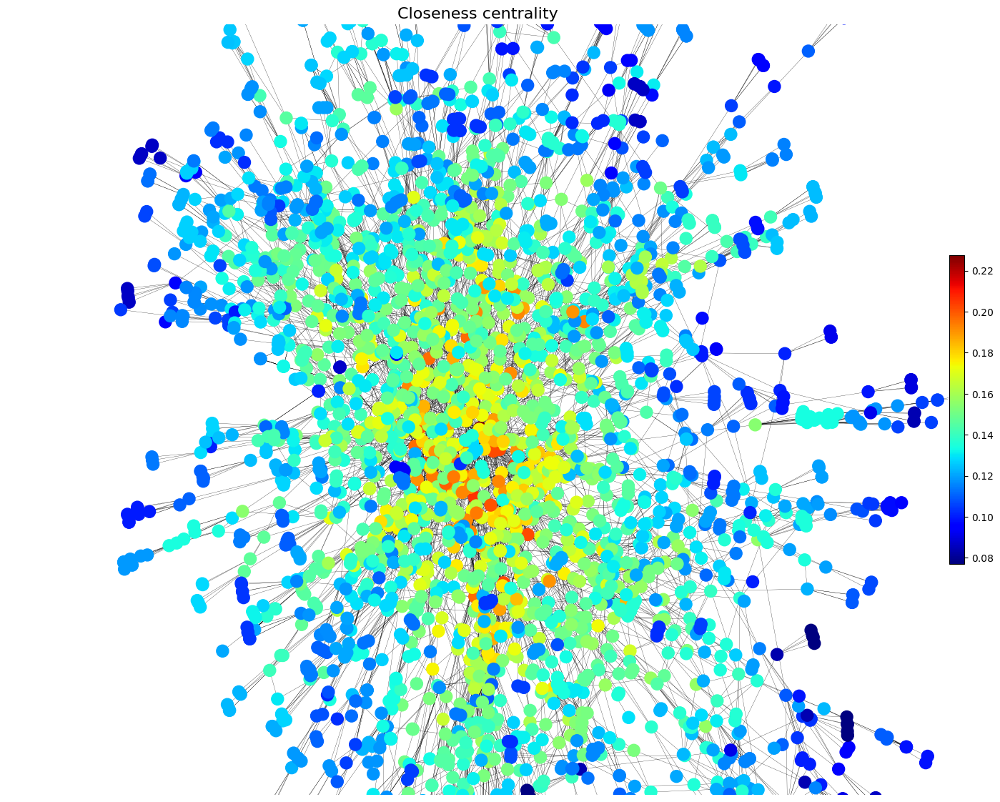

In [44]:
plt.figure(figsize=(20,14))
closeness_centr = nx.closeness_centrality(Gc)
node_colors = list(closeness_centr.values())

nodes = nx.draw_networkx_nodes(Gc, pos = coords,
                               node_color=node_colors,
                               node_size = 150,
                               nodelist=list(closeness_centr.keys()),
                               cmap = 'jet')
edges = nx.draw_networkx_edges(Gc, pos = coords, width = .2)
plt.xlim([-.95, .9])
plt.ylim([-.5, .6])
plt.colorbar(nodes, shrink=.4, pad=.0005, aspect=20)
plt.title('Closeness centrality', fontsize = 16)
plt.axis("off")

top_nodes = sorted(closeness_centr, key = closeness_centr.get)[-3:]

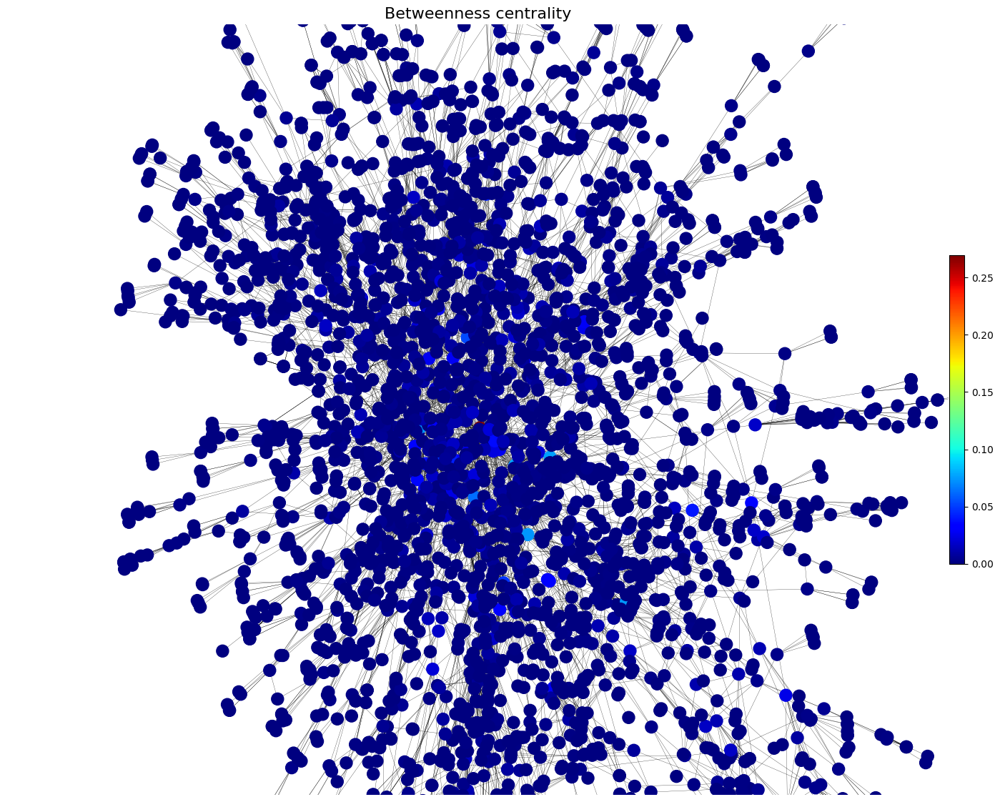

In [45]:
plt.figure(figsize=(20,14))
between_centr = nx.betweenness_centrality(Gc)
node_colors = list(between_centr.values())

nodes = nx.draw_networkx_nodes(Gc, pos = coords,
                               node_color=node_colors,
                               node_size = 150,
                               nodelist=list(between_centr.keys()),
                               cmap = 'jet')
edges = nx.draw_networkx_edges(Gc, pos = coords, width = .2)
plt.xlim([-.95, .9])
plt.ylim([-.5, .6])
plt.colorbar(nodes, shrink=.4, pad=.0005, aspect=20)
plt.title('Betweenness centrality', fontsize = 16)
plt.axis("off")

top_nodes = sorted(between_centr, key = between_centr.get)[-5:]

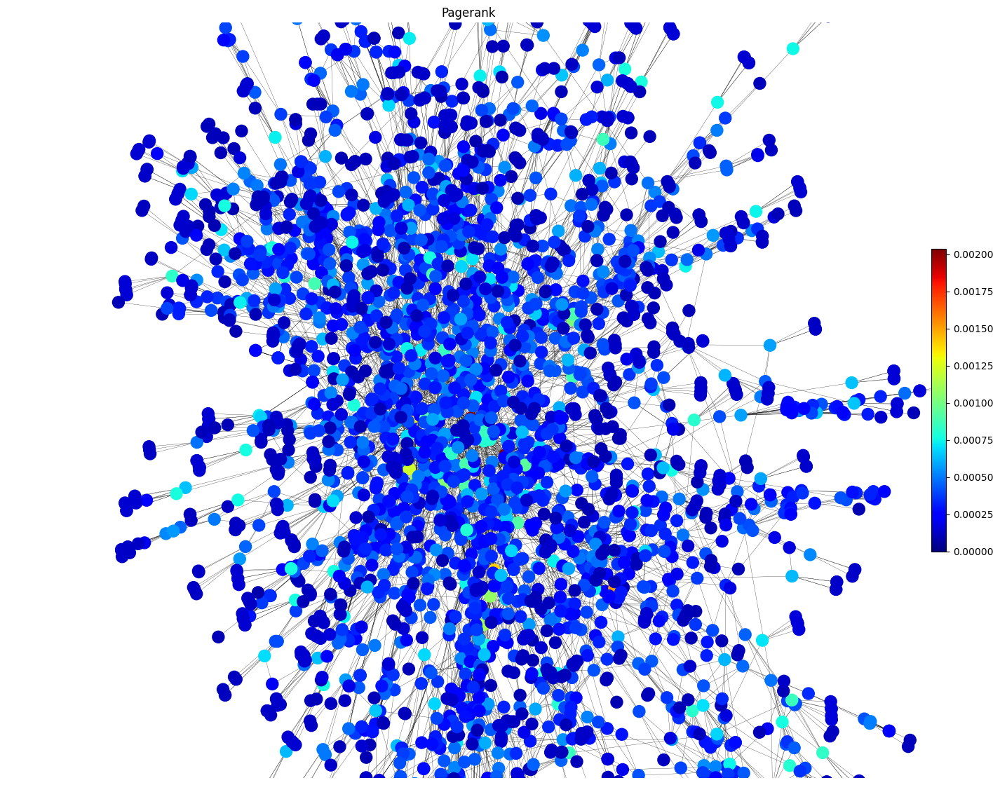

In [46]:
plt.figure(figsize=(20,14))
page_rank = nx.pagerank(Gc)
node_colors = list(page_rank.values())

nodes = nx.draw_networkx_nodes(Gc, pos = coords,
                               node_color=node_colors,
                               node_size = 150,
                               nodelist=list(page_rank.keys()),
                               cmap = 'jet',
                               vmin = 0.0)
edges = nx.draw_networkx_edges(Gc, pos = coords, width = .2)
plt.xlim([-.95, .9])
plt.ylim([-.5, .6])
plt.colorbar(nodes, shrink=.4, pad=.0005, aspect=20)
plt.title('Pagerank')
plt.axis("off")

top_nodes = sorted(page_rank, key = page_rank.get)[-3:]

## Finding Missing Edges from the Network

In [4]:
Source = set(Dataset['Source'].unique())
Target = set(Dataset['Target'].unique())
Nodes = list(Source.union(Target))
Number_of_Nodes = len(Nodes)
Adjacency_Matrix = nx.to_numpy_array(Graph, nodelist = Nodes)

In [5]:
Missing_Nodes = []
Number = 0
for i in tqdm(range(Number_of_Nodes)):
    for j in range(Number, Number_of_Nodes):
        if(i != j):
            try:
                if nx.shortest_path_length(Graph, Nodes[i], Nodes[j]) <= 2: 
                    if Adjacency_Matrix[i,j] == 0:
                        Missing_Nodes.append([Nodes[i], Nodes[j]])
            except:
                continue
    Number += 1

100%|██████████| 3364/3364 [09:24<00:00,  5.96it/s] 


## Sampling a Part of Connected Edges for Training

In [7]:
Removed_Edges = []
DF = Dataset.copy()
N = 0
for i in tqdm(Dataset.index.values):
    Current = nx.from_pandas_edgelist(DF.drop(index = i), 'Source', 'Target', create_using = nx.Graph())
    if(nx.number_connected_components(Current) == 1 and len(Current.nodes) == Number_of_Nodes):
        N += 1
        if(N >= 2):
            N = 0
            continue
        Removed_Edges.append(i)
        DF = DF.drop(index = i)

100%|██████████| 10000/10000 [04:30<00:00, 36.91it/s]


## Combining Data of Connected and Missing Edges for Training

In [12]:
Positive_Samples = Dataset.loc[Removed_Edges]
Positive_Samples['Label'] = 1
#Positive_Samples = Positive_Samples.drop(labels = ["Unnamed: 0"], axis = 1)
Positive_Samples

,Source,Target,Label
0,1,2,1
2,1,5,1
4,2,11,1
6,2,13,1
8,3,63,1
...,...,...,...
9973,2078,76,1
9977,2079,966,1
9982,2080,2186,1
9988,2081,1849,1


In [8]:
Positive_Samples

,Source,Target,Label
0,1,2,1
2,1,5,1
4,2,11,1
6,2,13,1
8,3,63,1
...,...,...,...
9973,2078,76,1
9977,2079,966,1
9982,2080,2186,1
9988,2081,1849,1


In [13]:
Positive_Samples.to_csv('Positive_Samples.csv')

In [14]:
Negative_Samples = pd.DataFrame(list(Missing_Nodes), columns = ['Source', 'Target'])
Negative_Samples['Label'] = 0

In [15]:
Negative_Samples = Negative_Samples.head(4330)

In [16]:
Negative_Samples

,Source,Target,Label
0,1,6,0
1,1,7,0
2,1,8,0
3,1,9,0
4,1,10,0
...,...,...,...
4325,82,305,0
4326,82,317,0
4327,82,354,0
4328,82,358,0


In [17]:
Negative_Samples.to_csv('Negative_Samples.csv')

In [18]:
Train_Dataset = pd.concat([Positive_Samples, Negative_Samples], axis = 0)

In [19]:
Train_Dataset

,Source,Target,Label
0,1,2,1
2,1,5,1
4,2,11,1
6,2,13,1
8,3,63,1
...,...,...,...
4325,82,305,0
4326,82,317,0
4327,82,354,0
4328,82,358,0


In [20]:
Train_Dataset.to_csv('Train_Dataset.csv')

In [21]:
X_Dataset = Train_Dataset[['Source', 'Target']]
Y_Dataset = Train_Dataset['Label']
X_Train, X_Test, Y_Train, Y_Test  = train_test_split(X_Dataset, Y_Dataset, test_size = 0.3, random_state = 10)

## Training Samples using Support Vector Classfier

In [22]:
kernels = ['rbf', 'linear']
c_values = [0.001, 0.01, 0.1, 1]
param_grid = {'kernel':kernels, 'C':c_values}

SVM_Model = GridSearchCV(cv = 10, estimator = svm.SVC(), param_grid = param_grid)

In [23]:
SVM_Model.fit(X_Train, Y_Train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [0.001, 0.01, 0.1, 1],
                         'kernel': ['rbf', 'linear']})

In [24]:
print(classification_report(SVM_Model.best_estimator_.predict(X_Test), Y_Test))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1374
           1       0.94      1.00      0.97      1224

    accuracy                           0.97      2598
   macro avg       0.97      0.97      0.97      2598
weighted avg       0.97      0.97      0.97      2598



In [25]:
print(confusion_matrix(SVM_Model.best_estimator_.predict(X_Test), Y_Test))

[[1292   82]
 [   0 1224]]
